# Detectron2: Zebrafish

## Install detectron2

> **Important**: If you're running on a local machine, be sure to follow the [installation instructions](https://github.com/facebookresearch/detectron2/blob/master/INSTALL.md). This notebook includes only what's necessary to run in Colab.

In [ ]:
# install dependencies: (use cu100 because colab is on CUDA 10.0)
!pip install -U torch==1.4+cu100 torchvision==0.5+cu100 -f https://download.pytorch.org/whl/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
!gcc --version
# opencv is pre-installed on colab

In [ ]:
# install detectron2:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/index.html

## Train on a custom dataset

In [1]:
# import some common libraries
import torch, torchvision
import itertools
import json
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
import detectron2
from detectron2.utils.logger import setup_logger
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode




setup_logger()

<Logger detectron2 (DEBUG)>

Here we download our dataset from github.

In [ ]:
!wget https://github.com/j0rd1smit/fish_dataset/archive/fish_dataset.zip
!unzip fish_dataset.zip > /dev/null

In order to use a dataset with Detectron2 we need to register it. For more information check out the [official documentation](https://detectron2.readthedocs.io/tutorials/datasets.html#register-a-dataset).

In [2]:
# here we change the annotations into the format that is need for elector
def get_fish_dicts(img_dir):
    json_file = os.path.join(img_dir, "annotations.json")
    print(json_file)
    with open(json_file) as f:
        data = json.load(f)

    dataset_dicts = []
    for k, image_data in data.items():
        record = {}

        record["file_name"] = os.path.join(img_dir, image_data["filename"])

        h, w = cv2.imread(record["file_name"]).shape[:2]
        record["height"] = h
        record["width"] = w

        annotations = []

        for region in image_data["regions"]:
            shape_attributes = region["shape_attributes"]
            px = shape_attributes["all_points_x"]
            py = shape_attributes["all_points_y"]

            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = list(itertools.chain.from_iterable(poly))

            annotation = {
                "bbox": [min(px), min(py), max(px), max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": 0,  # There is only 1 catagory
                "iscrowd": 0
            }
            annotations.append(annotation)

        record["annotations"] = annotations

        dataset_dicts.append(record)
    return dataset_dicts

# This need to be able to rerun the cell in a notebook
DatasetCatalog.clear()

# Register both datasets.
for d in ["train", "test"]:
    DatasetCatalog.register("fish_dataset-fish_dataset_" + d, lambda: get_fish_dicts("fish_dataset-fish_dataset/" + d))
    MetadataCatalog.get("fish_dataset-fish_dataset_" + d).set(thing_classes=["zebra_fish"])
fish_metadata = MetadataCatalog.get("fish_dataset-fish_dataset_train")

Here we display some of the images in the dataset:

fish_dataset-fish_dataset/train/annotations.json


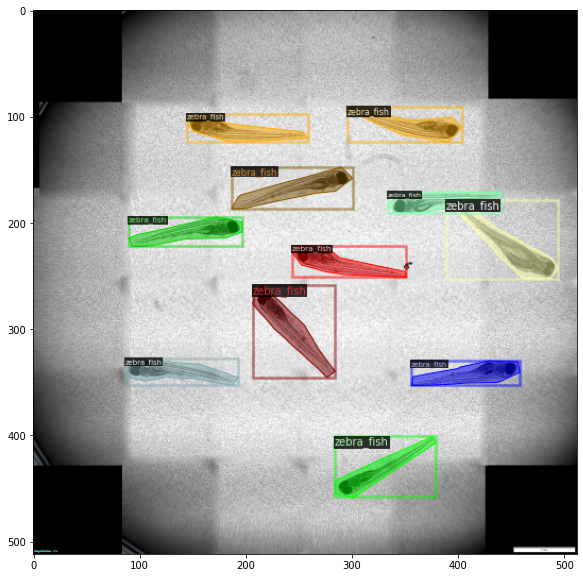

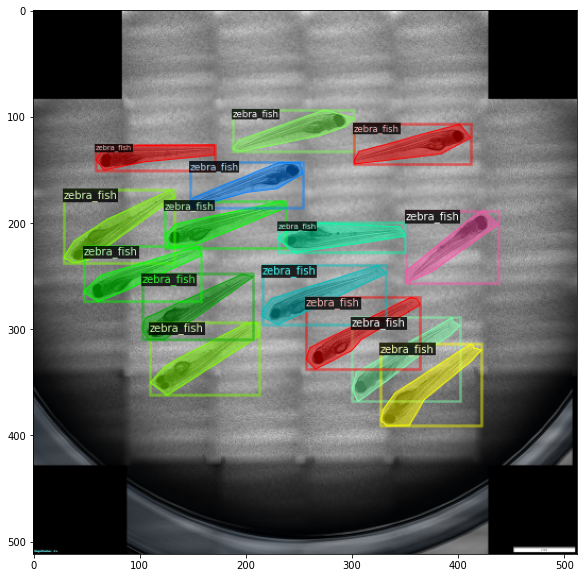

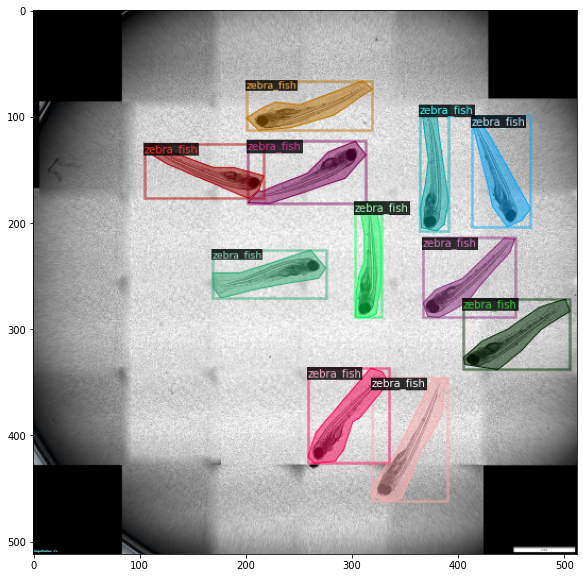

In [3]:
dataset_dicts = get_fish_dicts("fish_dataset-fish_dataset/train")

for image_data in dataset_dicts[:3]:
    img = cv2.imread(image_data["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=fish_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(image_data)

    plt.figure(figsize = (14, 10))
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.show()

Here we fine tune a model from the zoo to our dataset.

In [4]:
cfg = get_cfg()
# cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")) # only bounding boxes
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")) # only segmentation and bounding boxes

cfg.DATASETS.TRAIN = ("fish_dataset-fish_dataset_train",)
cfg.DATASETS.TEST = ("fish_dataset-fish_dataset_test",)   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2

#cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")  # only bounding boxes
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml") # only segmentation and bounding boxes

cfg.SOLVER.IMS_PER_BATCH = 5
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 400
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 5   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (zebra_fish)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=True)
trainer.train()

[05/14 15:02:17 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

fish_dataset-fish_dataset/test/annotations.json
[05/14 15:02:17 d2.data.build]: Removed 0 images with no usable annotations. 4 images left.
[05/14 15:02:17 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
| zebra_fish | 57           |
|            |              |
[05/14 15:02:17 d2.data.common]: Serializing 4 elements to byte tensors and concatenating them all ...
[05/14 15:02:17 d2.data.common]: Serialized dataset takes 0.01 MiB
[05/14 15:02:17 d2.data.detection_utils]: TransformGens used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[05/14 15:02:17 d2.data.build]: Using training sampler TrainingSampler
[05/14 15:02:17 d2.engine.train_loop]: Starting training from iteration 0
[05/14 15:02:27 d2.utils.events]:  eta: 0:03:06  iter: 19  total_loss: 2.232  loss_cls: 0.641  loss_box_reg: 0.757  loss_mask: 0.687  loss_rpn_cls

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

Here we create a predictor using the learned weights.

In [5]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("fish_dataset-fish_dataset_test", )
predictor = DefaultPredictor(cfg)

Here we display the prediction for the unseen testset.

fish_dataset-fish_dataset/test/annotations.json


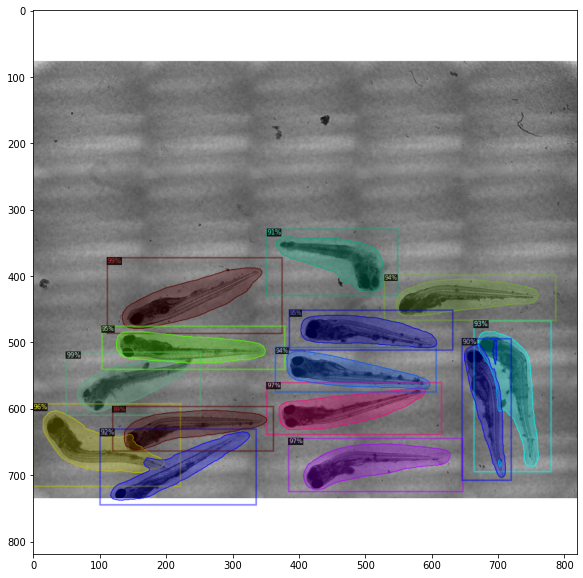

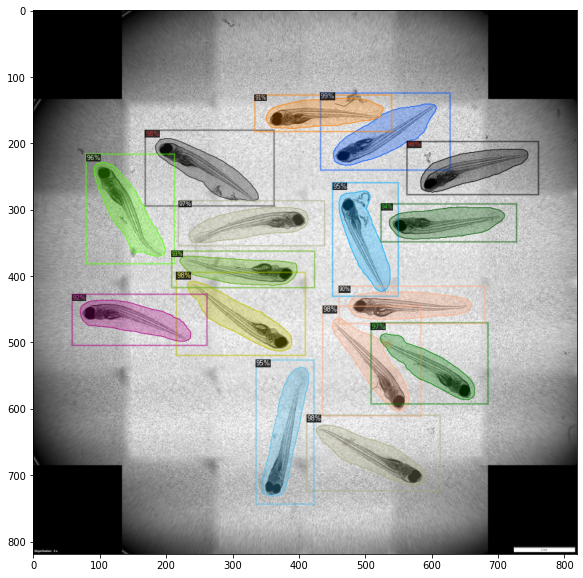

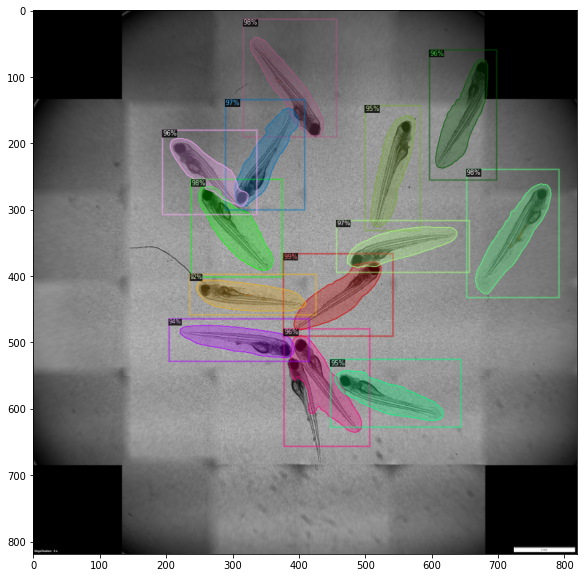

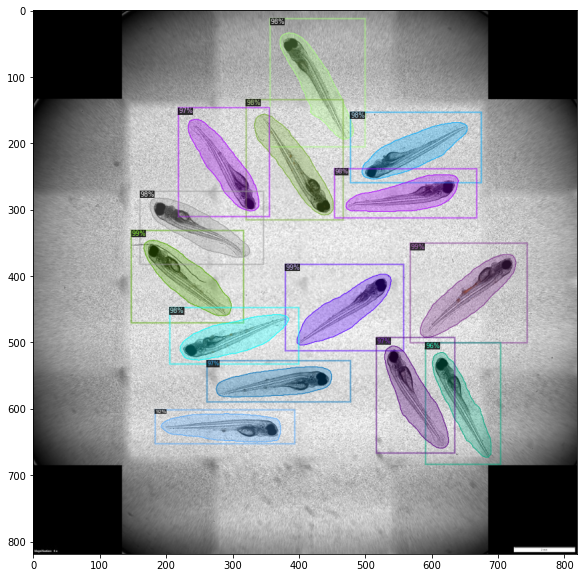

In [6]:
from detectron2.utils.visualizer import ColorMode
data = get_fish_dicts("fish_dataset-fish_dataset/test")

for image_data in data:    
    im = cv2.imread(image_data["file_name"])
    outputs = predictor(im)    


    v = Visualizer(im[:, :, ::-1],
                   metadata=fish_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))


    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()



Here we display the target bounding boxes for the testset.

In [ ]:
from matplotlib.patches import Rectangle

data = get_fish_dicts("fish_dataset-fish_dataset/test")

for image_data in data:    
    img = cv2.imread(image_data["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=fish_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(image_data)
    
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(vis.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

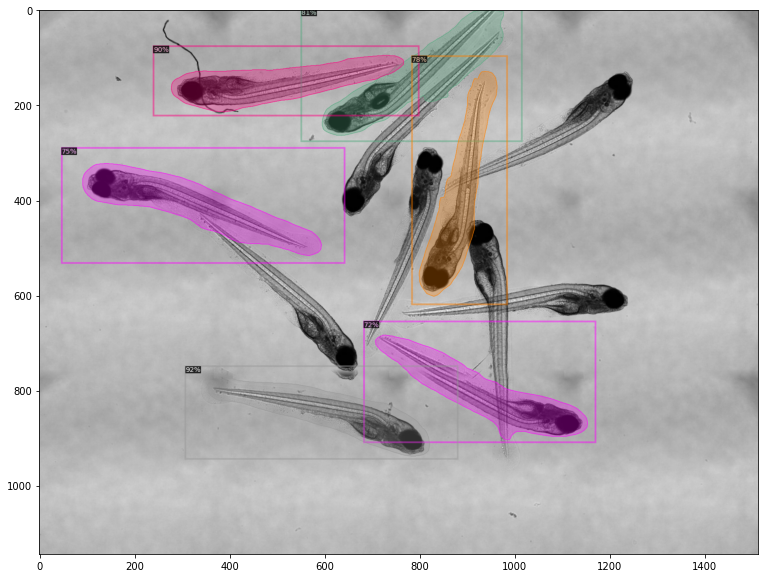

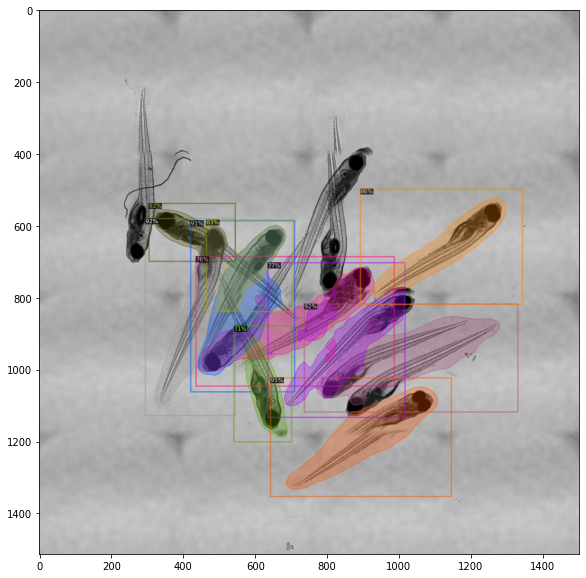

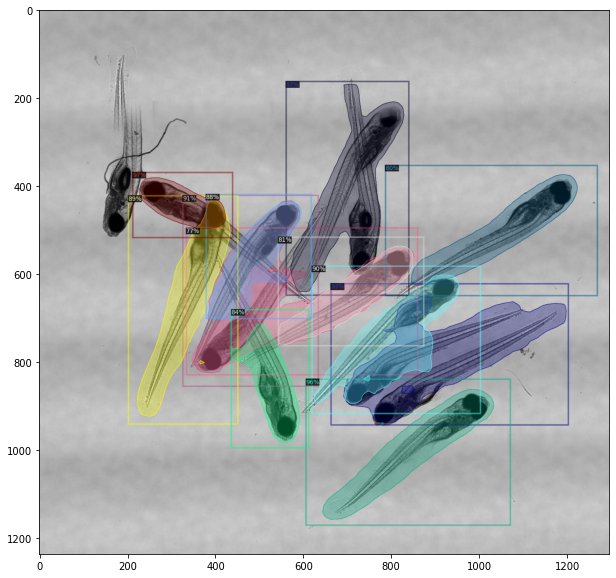

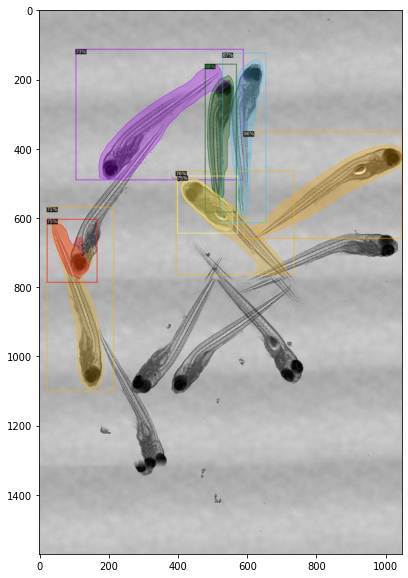

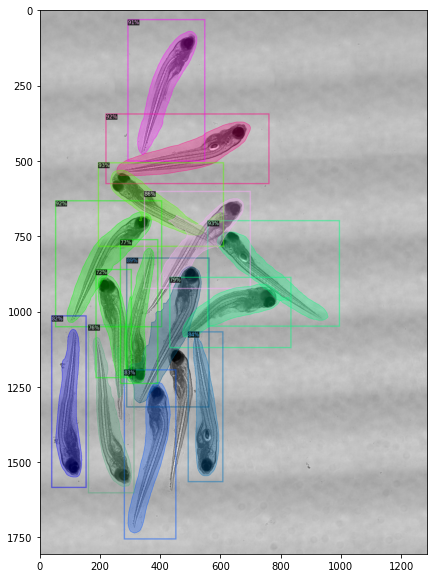

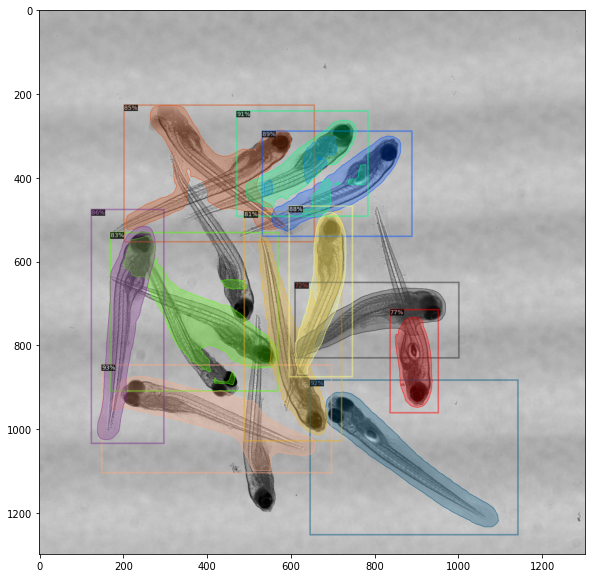

In [10]:
for path in ["training disordered_Snapshot_20190312_2875.jpg", "training disordered_Snapshot_20190312_2876.jpg", "training disordered_Snapshot_20190312_2878.jpg", "training disordered_Snapshot_20190312_2881.jpg", "training disordered_Snapshot_20190312_2884.jpg", "training disordered_Snapshot_20190312_2885.jpg"]:
    im = cv2.imread("unseen/" + path)
    outputs = predictor(im)    


    v = Visualizer(im[:, :, ::-1],
                   metadata=fish_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))


    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()